# Setup

## Import librairies

In [1]:
import cv2
import os
from google.colab import drive
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
import matplotlib.pyplot as plt
import numpy as np
from skimage.measure import regionprops, label
import glob
import random
import imageio
import PIL
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
from skimage.morphology import convex_hull_image, erosion
from skimage.morphology import square
import matplotlib.image as mpimg
import skimage
import math
from scipy.ndimage.filters import convolve
from PIL import Image,ImageFilter
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

ModuleNotFoundError: No module named 'cv2'

# I. Traitement de l'image

## I.1. Chargement de l'image

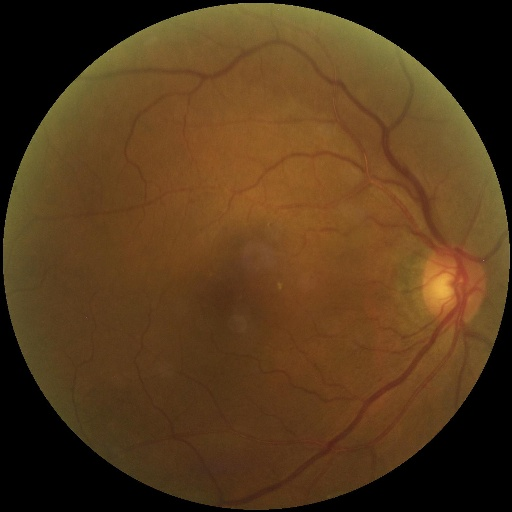

In [46]:

path = "/data/images"

def get_image(path, position):
  images = os.listdir(path)
  image = cv2.imread(path+"/"+images[position])
  return image

def show3D(image):
  cv2_imshow(image)

image = get_image(path, 50)
show3D(image)

## I.2. Extraction de l'image en canal vert

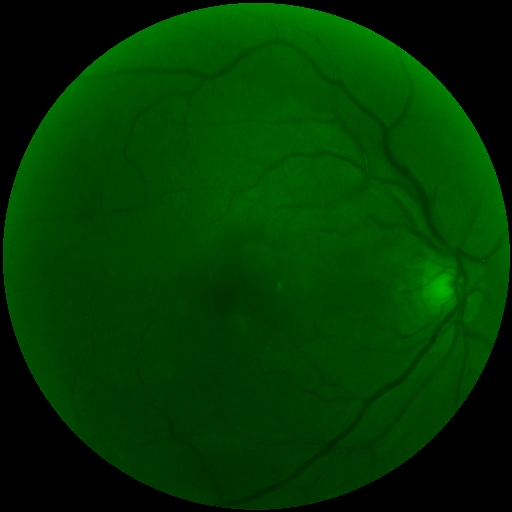

In [47]:
def green(image):
  green_channel = image[:,:,1]
  image_green = np.zeros(image.shape)
  image_green[:,:,1] = green_channel

  return image_green

image_green = green(image)
show3D(image_green)

## I.3. Conversion de l'image en niveaux de gris 2D

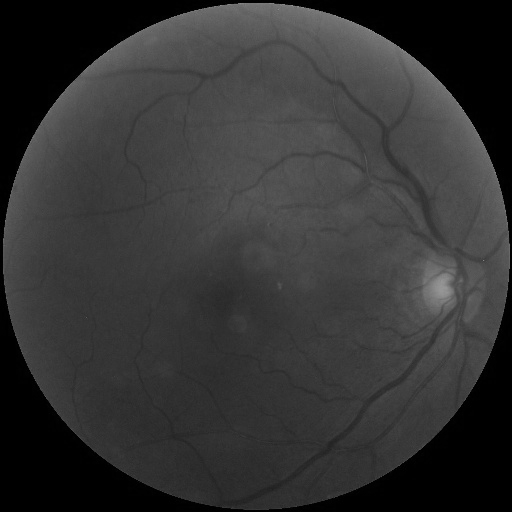

In [48]:
def gray(image):
  r, v, b = image[:,:,0], image[:,:,1], image[:,:,2]
  image_gris = 0.30 * r + 0.60 * v + 0.10 * b
  image_gris = np.ceil(image_gris).astype(np.int32)

  return image_gris

image_gris = gray(image)
show3D(image_gris)

## I.4. Histogramme de l'image

### I.4.a. Histogramme non-égalisé

In [49]:
def histogramme(img):
  hist = np.zeros(256)
  bins = np.linspace(0, 255, num=256)
  for pixel in np.unique(img.flatten()):
    hist[pixel] = np.count_nonzero(img == pixel)
  return [bins, hist]

histogram = histogramme(image_gris)

df = pd.DataFrame({"bin": histogram[0], "count": histogram[1]})
fig = px.bar(df, x="bin", y="count", title="Histogramme non-égalisé")
fig.show()

### I.4.b. Histogramme cumulé

In [50]:
def histo_cumul(img):
  histogram = histogramme(img)
  bins = histogram[0]
  hist = histogram[1]
  hist_cumul = hist
  s = 0
  for i in range(len(hist)):
    s = s + hist_cumul[i]
    hist_cumul[i] = s
  return [bins, hist_cumul]

histogram_cumul = histo_cumul(image_gris)

df = pd.DataFrame({"bin": histogram_cumul[0], "count": histogram_cumul[1]})
fig = px.bar(df, x="bin", y="count", title="Histogramme cumulé")
fig.show()

### I.4.c Histogramme et image égalisée

##### *Histogramme égalisé*

In [51]:
def egalisation(img):
  histogram = histo_cumul(img)
  probas = [histogram[0], histogram[1]/len(img.flatten())]
  L = len(np.unique(img.flatten()))

  img_egalisee = np.copy(img)
  m = img_egalisee.shape[0]
  n = img_egalisee.shape[1]

  for i in range(m):
    for j in range(n):
      p = np.where(probas[0] == img_egalisee[i,j])[0][0]
      #if img_egalisee[i,j]<=15:
      #  img_egalisee[i,j] = 0
      #else:
      img_egalisee[i,j] = (L-1)*probas[1][p]
      #img_egalisee[i,j] = 255*probas[1][p]
  return img_egalisee

image_egalisee = egalisation(image_gris)
histogram_egal = histogramme(image_egalisee)

df = pd.DataFrame({"bin": histogram_egal[0], "count": histogram_egal[1]})
fig = px.bar(df, x="bin", y="count", title="Histogramme égalisé")
fig.show()

##### *Image égalisée*

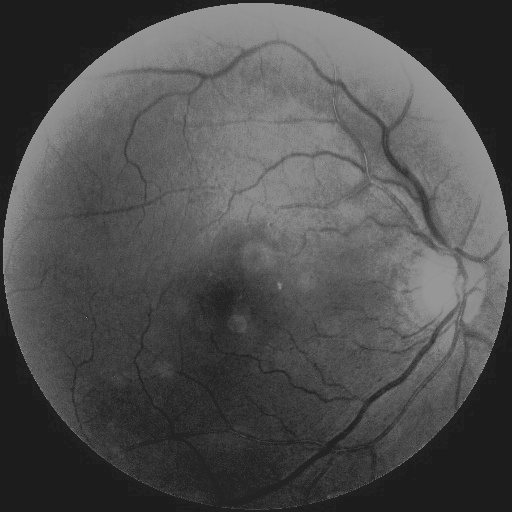

In [52]:
show3D(image_egalisee)

Nous allons utiliser l'image égalisée pour les prochaines étapes de traitement.

##I.5. Extraction des vaisseaux de la rétine par filtrage (détection de contours)

### I.5.a. Filtre de Prewitt

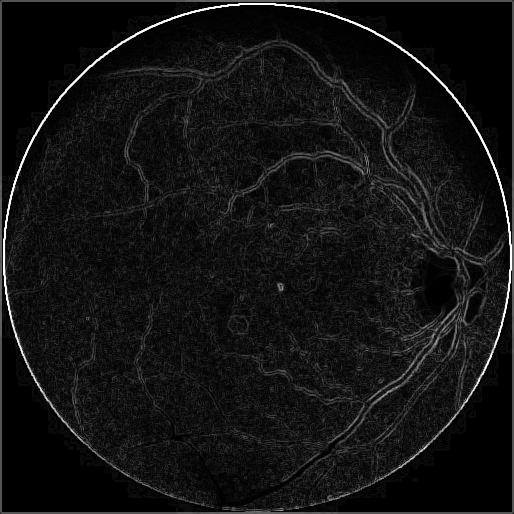

In [53]:
def prewitt(img):
  hx = np.array([[-1,0,1], [-1,0,1], [-1,0,1]])
  hy = np.array([[-1,-1,-1], [0,0,0], [1,1,1]])
  Gx = convolve2d(img, hx)
  Gy = convolve2d(img, hy)
  image_filtree = np.sqrt(Gx*Gx + Gy*Gy)
  return image_filtree

show3D(prewitt(image_egalisee))

### I.5.b. Filtre de Sobel

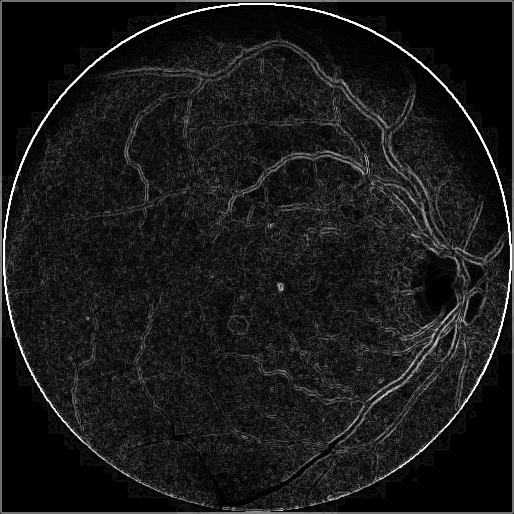

In [54]:
def sobel(img):
  hx = np.array([[-1,0,1], [-2,0,2], [-1,0,1]])
  hy = np.array([[-1,-2,-1], [0,0,0], [1,2,1]])
  Gx = convolve2d(img, hx)
  Gy = convolve2d(img, hy)
  image_filtree = np.sqrt(Gx*Gx + Gy*Gy)
  return image_filtree

show3D(sobel(image_egalisee))

### I.5.c. Filtre de Canny

L'algorithme de Canny consiste à appliquer un filtre gaussien à l'image pour réduire le bruit avant d'appliquer un filtre de sobel pour détecter les contours.

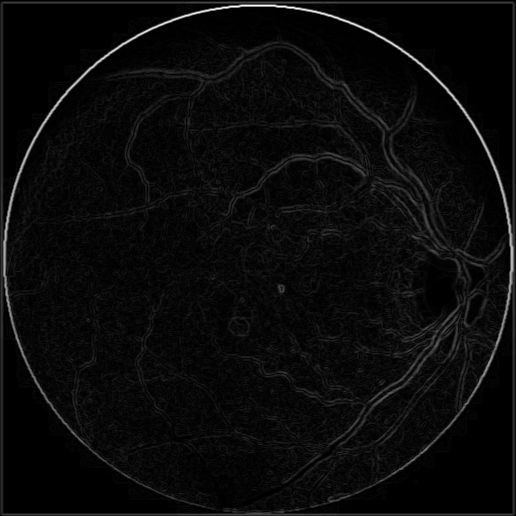

In [55]:
def gaussian(m,n, sigma,img):
  import skimage.measure
  kernel = skimage.measure.block_reduce(img, (m,n), np.mean)
  g = np.zeros((m,n))
  for i in range(m):
    for j in range(n):
      x1 = 2*np.pi*(sigma)**4
      x2 = -i*np.exp(-(i**2+j**2)/(2*(sigma)**2))
      g[i,j] = (1/x1)*x2
  return convolve2d(img,g)

def canny(img):
  m = 3
  n = 3
  g = gaussian(m,n,2, img)
  image_filtree0 = sobel(g)
  ## scaling de l'image pour avoir des valeurs entre 0 et 255
  min_pixel = image_filtree0.min() 
  max_pixel = image_filtree0.max()
  new_min = 0
  new_max = 255
  image_filtree = (image_filtree0-min_pixel)*(new_max-new_min)/(max_pixel-min_pixel)+new_min
  return image_filtree

show3D(canny(image_egalisee))

### I.5.d. Choix du filtre pour la détection des contours



In [56]:
fig = make_subplots(rows=1, cols=3)

fig.add_trace(
    px.imshow(prewitt(image_egalisee), color_continuous_scale='gray').data[0],
    row=1, col=1
)

fig.add_trace(
    px.imshow(sobel(image_egalisee), color_continuous_scale='gray').data[0],
    row=1, col=2
)

fig.add_trace(
    px.imshow(canny(image_egalisee), color_continuous_scale='gray').data[0],
    row=1, col=3
)

fig.update_layout(coloraxis_showscale=False)
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)

fig.update_layout(height=600, width=1200, title_text="Choix du filtre")
fig.show()

Nous avons choisi le filtre de Sobel pour détecter les contours des images rétiniennes.




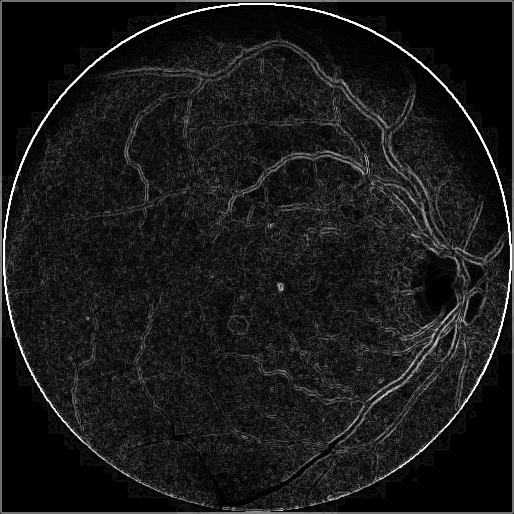

In [60]:
image_filtree = sobel(image_egalisee)
show3D(image_filtree)

## I.6. Binarisation de l'image filtrée par seuillage




Nous avons utilisé la **méthode d'otsu** pour calculer le seuil de binarisation.

seuil calculé par la méthode d'Otsu :  49
seuil calculé par la méthode d'Otsu :  49


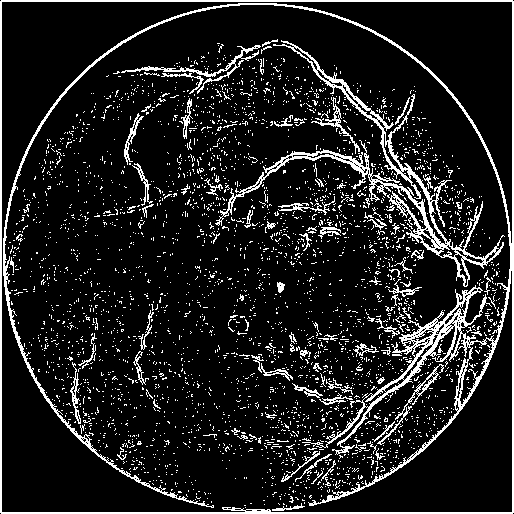

In [61]:
def methode_otsu(img):
    pixel_number = img.shape[0] * img.shape[1]
    mean_weight = 1.0/pixel_number
    his, bins = np.histogram(img, np.arange(0,257))
    final_thresh = -1
    final_value = -1
    intensity_arr = np.arange(256)
    for t in bins[1:-1]: 
        pcb = np.sum(his[:t])
        pcf = np.sum(his[t:])
        Wb = pcb * mean_weight
        Wf = pcf * mean_weight

        mub = np.sum(intensity_arr[:t]*his[:t]) / float(pcb)
        muf = np.sum(intensity_arr[t:]*his[t:]) / float(pcf)
        #print mub, muf
        value = Wb * Wf * (mub - muf) ** 2

        if value > final_value:
            final_thresh = t
            final_value = value
    final_img = img.copy()
    print("seuil calculé par la méthode d'Otsu : ",final_thresh)
    final_img[img > final_thresh] = 255
    final_img[img < final_thresh] = 0
    return [final_img, final_thresh]

image_binarisee = methode_otsu(image_filtree)[0]
seuil_otsu = methode_otsu(image_filtree)[1]
show3D(image_binarisee)

## I.7 Suppression des régions mineures

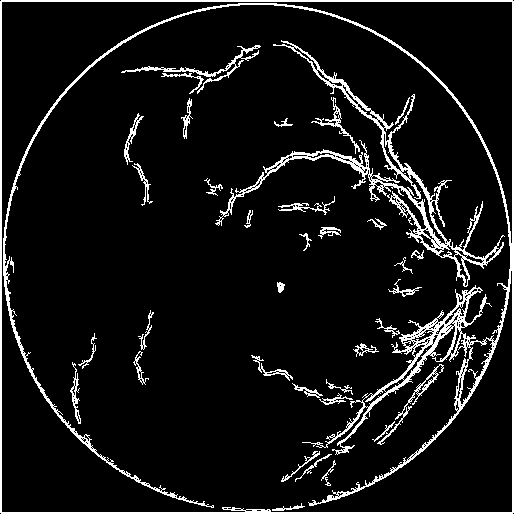

In [62]:
def segmentationByRegion(img,threshold):
  labels = label(img)
  props = regionprops(labels)
  regions_areas = [props[k].area for k in range(0, np.max(labels))]
  newImg = img
  
  for k in range(0,len(regions_areas)):
    if(regions_areas[k]<=threshold):
      for pixel in props[k].coords:
        newImg[pixel[0],pixel[1]]= 0

  return newImg

image_segmentee = segmentationByRegion(image_binarisee, seuil_otsu)
show3D(image_segmentee)

## I.8 Amincissement

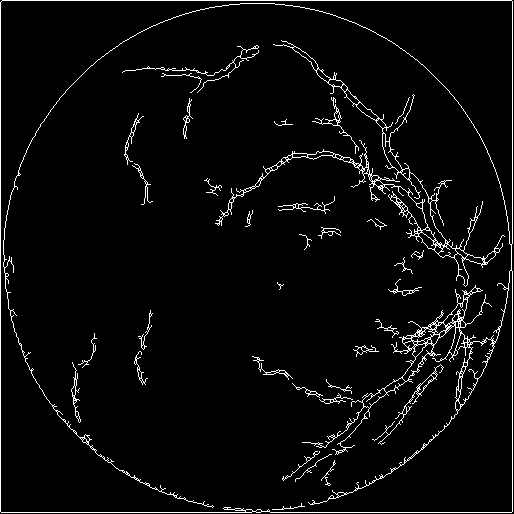

In [63]:
def amincissement(image):
  img = image
  img = np.array(img > img.mean()).astype(int)
  image_skel = skimage.morphology.skeletonize(img)
  image_skel = np.uint8(image_skel)*255;

  return image_skel

image_skel = amincissement(image_segmentee)
show3D(image_skel)

## I.9 Détection des minuties

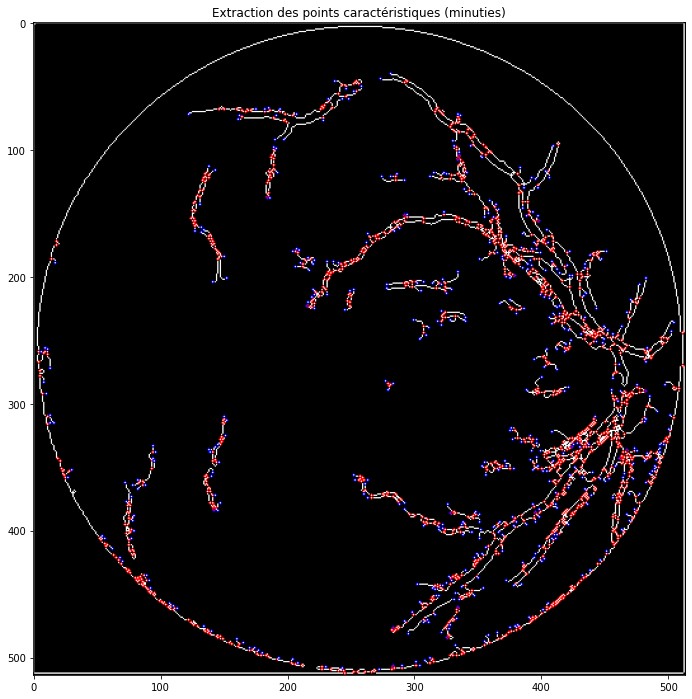

In [64]:
def detection_crete(img, sigma= 0.1):
    H_elems = hessian_matrix(img, sigma=sigma, order='rc')
    maxima_crete, minima_crete = hessian_matrix_eigvals(H_elems)
    return maxima_crete, minima_crete

def get_term_bif(img, masque):
    img = img == 255;
    (rows, cols) = img.shape;
    minutiaeTerm = np.zeros(img.shape);
    minutiaeBif = np.zeros(img.shape);
    
    for i in range(1,rows-1):
        for j in range(1,cols-1):
            if(img[i][j] == 1):
                block = img[i-1:i+2,j-1:j+2];
                block_val = np.sum(block);
                if(block_val == 2):
                    minutiaeTerm[i,j] = 1;
                elif(block_val == 4):
                    minutiaeBif[i,j] = 1;
    
    masque = convex_hull_image(masque>0)
    masque = erosion(masque, square(5))         
    minutiaeTerm = np.uint8(masque)*minutiaeTerm
    return(minutiaeTerm, minutiaeBif)

class MinutiaeFeature(object):
    def __init__(self, locX, locY, Orientation, Type):
        self.locX = locX;
        self.locY = locY;
        self.Orientation = Orientation;
        self.Type = Type;


def computeAngle(block, minutiaeType):
    angle = 0
    (blkRows, blkCols) = np.shape(block);
    CenterX, CenterY = (blkRows-1)/2, (blkCols-1)/2
    if(minutiaeType.lower() == 'termination'):
        sumVal = 0;
        for i in range(blkRows):
            for j in range(blkCols):
                if((i == 0 or i == blkRows-1 or j == 0 or j == blkCols-1) and block[i][j] != 0):
                    angle = -math.degrees(math.atan2(i-CenterY, j-CenterX))
                    sumVal += 1
                    if(sumVal > 1):
                        angle = float('nan');
        return(angle)
    elif(minutiaeType.lower() == 'bifurcation'):
        (blkRows, blkCols) = np.shape(block);
        CenterX, CenterY = (blkRows - 1) / 2, (blkCols - 1) / 2
        angle = []
        sumVal = 0;
        for i in range(blkRows):
            for j in range(blkCols):
                if ((i == 0 or i == blkRows - 1 or j == 0 or j == blkCols - 1) and block[i][j] != 0):
                    angle.append(-math.degrees(math.atan2(i - CenterY, j - CenterX)))
                    sumVal += 1
        if(sumVal != 3):
            angle = float('nan')
        return(angle)


def extractMinutiaeFeatures(skel, minutiaeTerm, minutiaeBif):
    FeaturesTerm = []

    minutiaeTerm = skimage.measure.label(minutiaeTerm, connectivity=2);
    RP = skimage.measure.regionprops(minutiaeTerm)
    
    WindowSize = 2          
    FeaturesTerm = []
    for i in RP:
        (row, col) = np.int16(np.round(i['Centroid']))
        block = skel[row-WindowSize:row+WindowSize+1, col-WindowSize:col+WindowSize+1]
        angle = computeAngle(block, 'Termination')
        FeaturesTerm.append(MinutiaeFeature(row, col, angle, 'Termination'))

    FeaturesBif = []
    minutiaeBif = skimage.measure.label(minutiaeBif, connectivity=2);
    RP = skimage.measure.regionprops(minutiaeBif)
    WindowSize = 1 
    for i in RP:
        (row, col) = np.int16(np.round(i['Centroid']))
        block = skel[row-WindowSize:row+WindowSize+1, col-WindowSize:col+WindowSize+1]
        angle = computeAngle(block, 'Bifurcation')
        FeaturesBif.append(MinutiaeFeature(row, col, angle, 'Bifurcation'))
    return(FeaturesTerm, FeaturesBif)

def ShowResults(skel, TermLabel, BifLabel):
    minutiaeBif = TermLabel * 0;
    minutiaeTerm = BifLabel * 0;

    (rows, cols) = skel.shape
    DispImg = np.zeros((rows, cols, 3), np.uint8)
    DispImg[:, :, 0] = skel;
    DispImg[:, :, 1] = skel;
    DispImg[:, :, 2] = skel;

    RP = skimage.measure.regionprops(BifLabel)
    for idx, i in enumerate(RP):
        (row, col) = np.int16(np.round(i['Centroid']))
        minutiaeBif[row, col] = 1;
        (rr, cc) = skimage.draw.circle_perimeter(row, col, 1);
        skimage.draw.set_color(DispImg, (rr, cc), (255, 0, 0));

    RP = skimage.measure.regionprops(TermLabel)
    for idx, i in enumerate(RP):
        (row, col) = np.int16(np.round(i['Centroid']))
        minutiaeTerm[row, col] = 1;
        (rr, cc) = skimage.draw.circle_perimeter(row, col, 1);
        skimage.draw.set_color(DispImg, (rr, cc), (0, 0, 255));
        
    plt.figure(figsize=(12,12))
    plt.title("Extraction des points caractéristiques (minuties)")
    plt.imshow(DispImg)

img = image_segmentee
img = np.array(img > img.mean()).astype(int)
skel = skimage.morphology.skeletonize(img)
skel = np.uint8(skel)*255;
masque = img*255;

(minutiaeTerm, minutiaeBif) = get_term_bif(skel, masque);
FeaturesTerm, FeaturesBif = extractMinutiaeFeatures(skel, minutiaeTerm, minutiaeBif)
BifLabel = skimage.measure.label(minutiaeBif, connectivity=1);
TermLabel = skimage.measure.label(minutiaeTerm, connectivity=1);
ShowResults(skel, TermLabel, BifLabel)

*Affichage des minuties sur un graphique séparée:*

In [65]:
import plotly.graph_objects as go

bif = BifLabel.copy()
term = TermLabel.copy()
bif[bif>0] = 255
term[term>0] = 255
x_bif, y_bif = np.nonzero(bif)[1], np.nonzero(bif)[0]
x_term, y_term = np.nonzero(term)[1], np.nonzero(term)[0]

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=x_bif, y=y_bif, name='bifurcation', mode='markers'))
fig.add_trace(go.Scatter(x=x_term, y=y_term, name='terminaison', mode='markers'),secondary_y=True)
fig.update_layout(width=600, height=500)
fig.show()

## I.10. Résumé

In [66]:
def findMinuties(img):
  img = np.array(img > img.mean()).astype(int)
  skel = skimage.morphology.skeletonize(img)
  skel = np.uint8(skel)*255;
  mask = img*255;
  (minutiaeTerm, minutiaeBif) = get_term_bif(skel, mask);
  FeaturesTerm, FeaturesBif = extractMinutiaeFeatures(skel, minutiaeTerm, minutiaeBif)
  BifLabel = skimage.measure.label(minutiaeBif, connectivity=1);
  TermLabel = skimage.measure.label(minutiaeTerm, connectivity=1);
  #ShowResults(skel, TermLabel, BifLabel)
  bif = BifLabel.copy()
  term = TermLabel.copy()
  bif[bif>0] = 255
  term[term>0] = 255
  x_bif, y_bif = np.nonzero(bif)[1], np.nonzero(bif)[0]
  x_term, y_term = np.nonzero(term)[1], np.nonzero(term)[0]
  plt.figure(figsize=(10,10))
  plt.scatter(x_bif, y_bif, c='r')
  plt.scatter(x_term, y_term, c='b')
  #plt.savefig(fname='img_minuties.png')
  plt.show()

In [43]:
def summury(image):
  # Step A - (show image 3D):
  print("Image 3D :")
  show3D(image)

  # Step B - (image green):
  print("Green image :")
  image_green = green(image)
  cv2_imshow(image_green)

  # Step C - (gray image):
  print("Image...")
  image_gris = gray(image)
  cv2_imshow(image_gris)

  # Egalisation:
  print("Image...")
  image_egalisee = egalisation(image_gris)
  cv2_imshow(image_egalisee)

  # Step D - (filtred image):
  print("Filtring image...")
  image_filtree = canny(image_egalisee)
  cv2_imshow(image_filtree)

  otsu = methode_otsu(image_filtree)

  # Step F - (binarisation):
  print("Binarisation...")
  image_binarisee = otsu[0]
  sueil_otsu = otsu[1]
  cv2_imshow(image_binarisee)

  # Step G - (Deleting minor regions):
  print('Deleting minor regions...')
  image_segmented = segmentationByRegion(image_binarisee,sueil_otsu)
  cv2_imshow(image_segmented)

  # Step H - (squelettisation):
  print("Squelettisation...")
  image_skel = amincissement(image_segmented)
  cv2_imshow(image_skel)

  # Step I - (Get minuties):
  print("Get minuties :")
  findMinuties(image_segmented)

Image 3D :


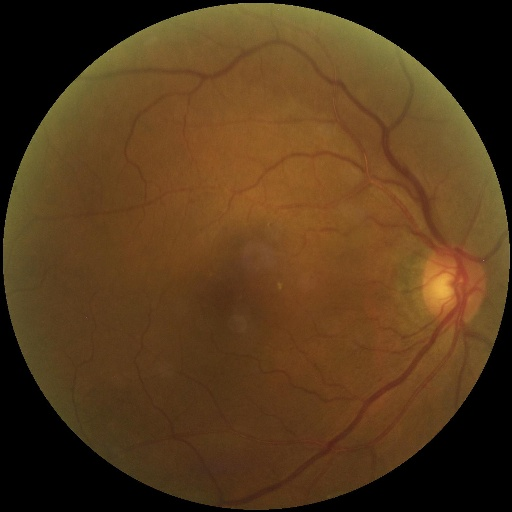

Green image :


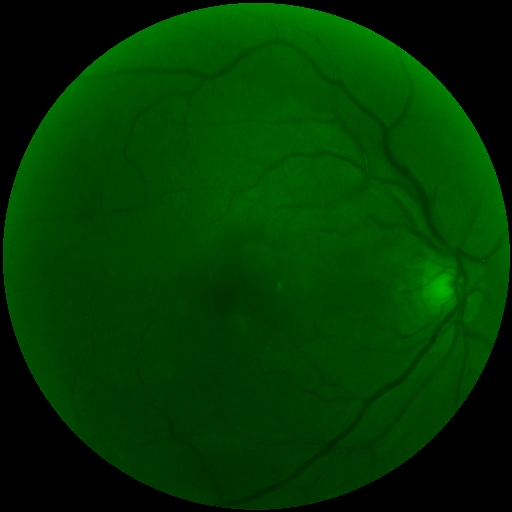

Image...


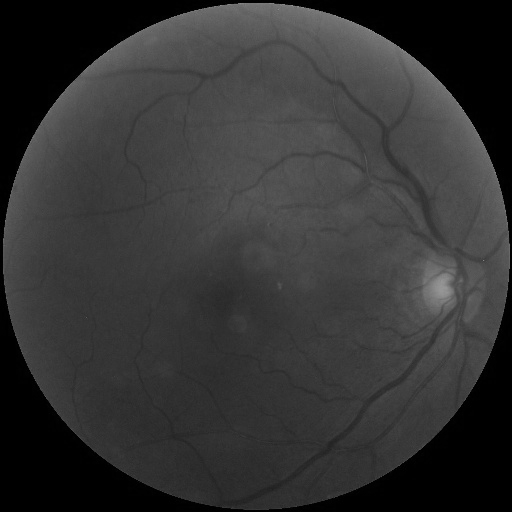

Image...


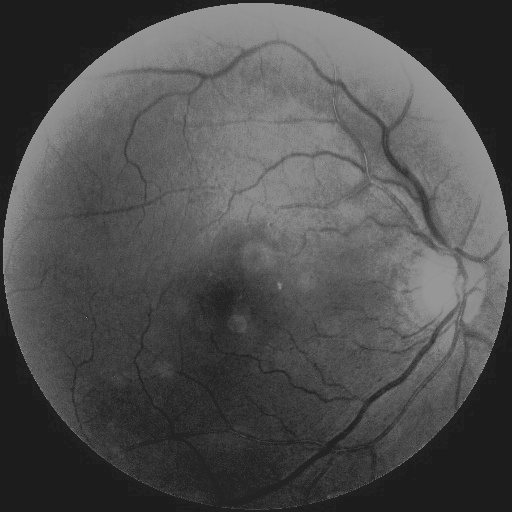

Filtring image...


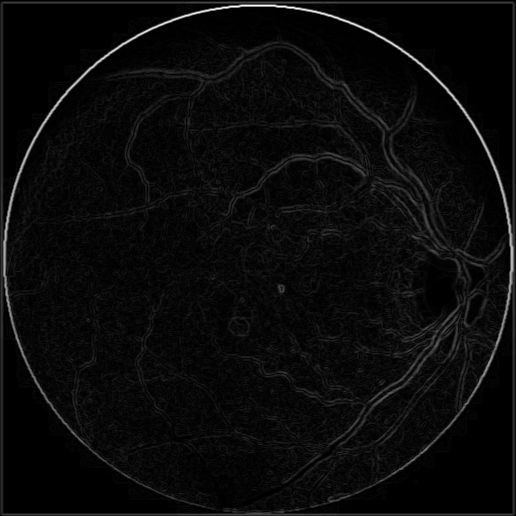

seuil calculé par la méthode d'Otsu :  75
Binarisation...


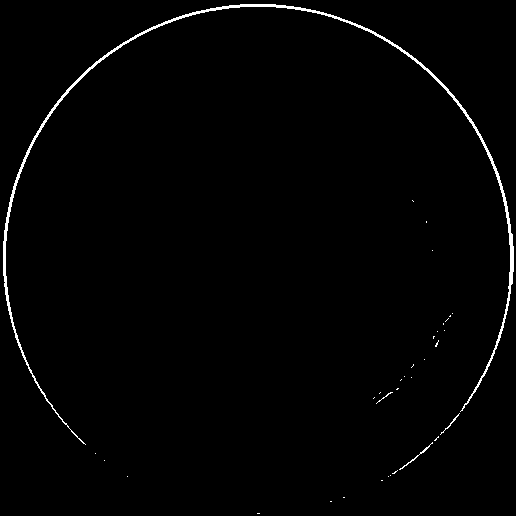

Deleting minor regions...


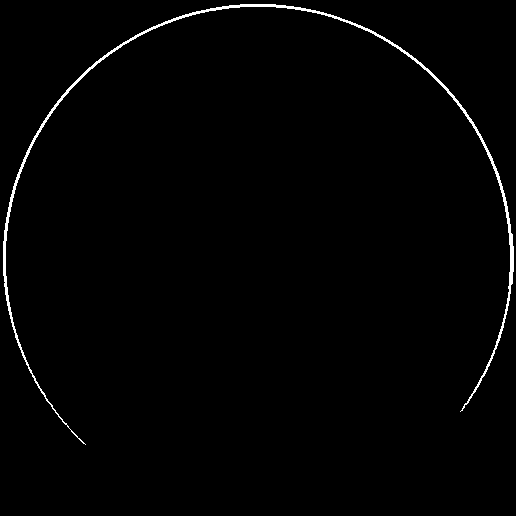

Squelettisation...


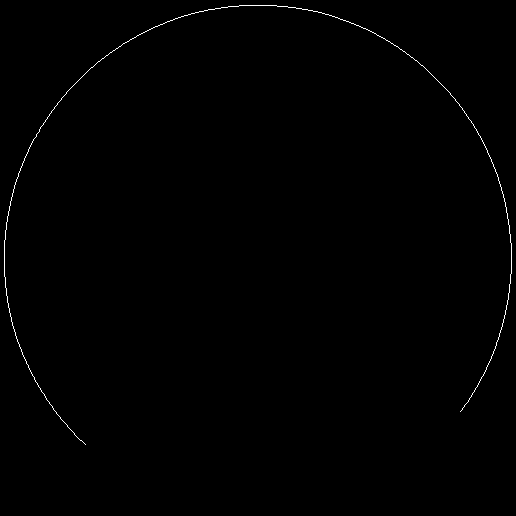

Get minuties :


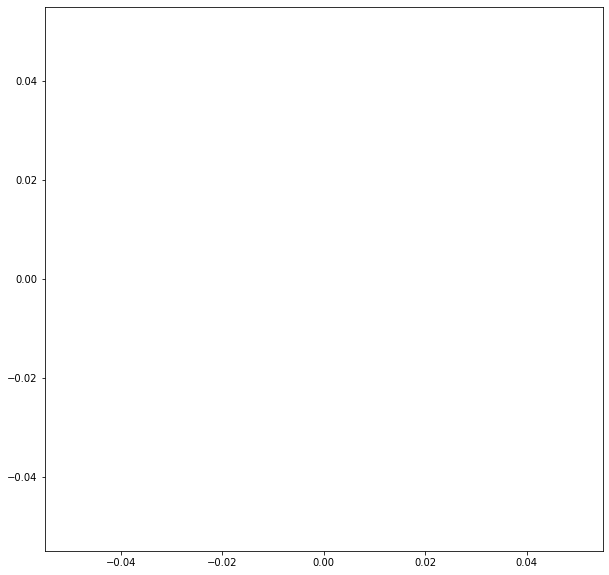

In [67]:
summury(image)

### Process image

In [68]:
def writeMinuties(img,pathFile):
  img = np.array(img > img.mean()).astype(int)
  skel = skimage.morphology.skeletonize(img)
  skel = np.uint8(skel)*255;
  mask = img*255;
  (minutiaeTerm, minutiaeBif) = get_term_bif(skel, mask);
  FeaturesTerm, FeaturesBif = extractMinutiaeFeatures(skel, minutiaeTerm, minutiaeBif)
  BifLabel = skimage.measure.label(minutiaeBif, connectivity=1);
  TermLabel = skimage.measure.label(minutiaeTerm, connectivity=1);

  bif = BifLabel.copy()
  term = TermLabel.copy()
  bif[bif>0] = 255
  term[term>0] = 255
  x_bif, y_bif = np.nonzero(bif)[1], np.nonzero(bif)[0]
  x_term, y_term = np.nonzero(term)[1], np.nonzero(term)[0]
  plt.figure(figsize=(10,10))
  plt.scatter(x_bif, y_bif, c='r')
  plt.scatter(x_term, y_term, c='b')
  
  plt.savefig("/data/dataset_filtred/"+ pathFile.split('dataset/')[1])

In [69]:
def process(image, pathFile):
  # Step B - (image green):
  image_green = green(image)

  # Step C - (gray image):
  image_gris = gray(image)

  # Egalisation:
  image_egalisee = egalisation(image_gris)

  # Step D - (filtred image):
  image_filtree = cannyFilter(image_egalisee)

  otsu = methode_otsu(image_filtree)

  # Step F - (binarisation):
  image_binarisee = otsu[0]
  sueil_otsu = otsu[1]

  # Step G - (Deleting minor regions):
  image_segmented = segmentationByRegion(image_binarisee,sueil_otsu)

  # Step H - (squelettisation):
  image_skel = amincissement(image_segmented)

  # Step I - (Upload minuties):
  writeMinuties(image_skel, pathFile)

# II. Cas pratique: Application en imagerie médicale

## II.1. Traitement des images

In [ ]:
def processing(folder):
  images = os.listdir("/data/dataset/"+folder)
  print(images)
  idx = 0
  for imagePath in images:
    pathFile = "/data/dataset/"+folder+""+imagePath
    image = cv2.imread(pathFile)
    process(image,pathFile)
    idx += 1
    print("Image "+str(idx)+" : Traited succefully ✅ - "+str(idx/len(images)*100)+"%")

### Images : Test - Cataract

In [ ]:
processing("test/cataract/")

### Images : Train - Cataract

In [ ]:
processing("training/cataract/")

### Images : Test - Normal

In [ ]:
processing("test/normal/")

### Images : Train - Normal

In [ ]:
processing("training/normal/")

In [ ]:
processing("single_prediction/")

## II.2. Réseau de neurones convolutif (CNN)


### Partie 1 - Prétraitement des données

Données d'apprentissage : 

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)
training_set = train_datagen.flow_from_directory('/data/dataset/training',
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 class_mode = 'binary')

Données de test : 



In [ ]:
test_datagen = ImageDataGenerator(rescale = 1./255)
test_set = test_datagen.flow_from_directory('/data/dataset/test',
                                            target_size = (64, 64),
                                            batch_size = 32,
                                            class_mode = 'binary')

### Partie 2 - Construction du CNN

Initialisation du CNN :

In [ ]:
cnn = tf.keras.models.Sequential()

Etape 1 : Couches de convolution

In [ ]:
cnn.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu', input_shape=[64, 64, 3]))

Etape 2 : Couches de Pooling

In [ ]:
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))

Ajout d'une couche de convolution

In [ ]:
cnn.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))

Etape 3 : Applatissement du tenseur

In [ ]:
cnn.add(tf.keras.layers.Flatten())

Etape 4 : Full connection

In [ ]:
cnn.add(tf.keras.layers.Dense(units=128, activation='relu'))

Etape 5 : Couche de sortie

In [ ]:
cnn.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

### Partie 3 - Apprentissage du CNN

In [ ]:
cnn.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

Apprentissage du CNN sur les images de training et évaluation de sa précision sur les images de test : 

In [ ]:
cnn.fit(x = training_set, validation_data = test_set, epochs = 25)

### Partie 4 - Prédiction sur une seule image

In [ ]:
from keras.preprocessing import image
test_image = image.load_img('data/dataset/single_prediction/prediction_1.jpg', target_size = (64, 64))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
result = cnn.predict(test_image)
training_set.class_indices
if result[0][0] == 1:
  prediction = 'normal'
else:
  prediction = 'cataract'

In [ ]:
print(prediction)